In [1]:
import numpy as np
import matplotlib.pyplot as plt
from numba import jit
import matplotlib as mpl
from tqdm.notebook import tqdm

In [2]:
@jit(nopython=True)
def RK4_ZZ(f, y0, t, args=()):
    n = len(t)
    y = np.zeros((n, len(y0)))
    Etheta = np.exp(1j*y0)
    Na = args[0]
    EA,EB = Etheta[:Na],Etheta[Na:]
    Z1a,Z2a = get_ZE12(EA)
    Z1b,Z2b = get_ZE12(EB)
    Z1as = np.zeros(n,dtype=np.complex64)
    Z1bs = np.zeros(n,dtype=np.complex64)
    Z2as = np.zeros(n,dtype=np.complex64)
    Z2bs = np.zeros(n,dtype=np.complex64)

    Z1as[0] = Z1a
    Z2as[0] = Z2a
    Z1bs[0] = Z1b
    Z2bs[0] = Z2b
    
    y[0] = y0
    
    for i in range(n - 1):
        h = t[i + 1] - t[i]
        k1,Z1a,Z1b,Z2a,Z2b = f(y[i], t[i], *args)
        k2,_,_,_,_ = f(y[i] + k1 * h / 2.0, t[i] + h / 2.0, *args)
        k3,_,_,_,_ = f(y[i] + k2 * h / 2.0, t[i] + h / 2.0, *args)
        k4,_,_,_,_ = f(y[i] + k3 * h, t[i] + h, *args)
        y[i + 1] = y[i] + (h / 6.0) * (k1 + 2 * k2 + 2 * k3 + k4)
        Z1as[i+1],Z1bs[i+1],Z2as[i+1],Z2bs[i+1] = Z1a,Z1b,Z2a,Z2b
    return y,(Z1as,Z1bs,Z2as,Z2bs)
@jit(nopython=True)
def get_ZE12(Etheta):
    ''' get theta and return r and theta'''
    E1 = Etheta
    E2 = E1**2
    Z1,Z2 = np.mean(E1),np.mean(E2)
    return Z1,Z2

@jit(nopython=True)
def Kuramoto_MF_CHIMERA(Theta,t,Na,Nb,beta,alpha,K):
    dtheta = np.zeros(Na+Nb)
    Etheta = np.exp(1j*Theta)
    EA,EB = Etheta[:Na],Etheta[Na:]
    Z1a,Z2a = get_ZE12(EA)
    Z1b,Z2b = get_ZE12(EB)
    A = np.exp(-1j*alpha)
    EA,EB = np.conjugate(EA), np.conjugate(EB)
    ZZa =  (Z1a+beta*Z1b)
    ZZb =  (Z1b+beta*Z1a)
    dtheta[:Na] = K*((A*(ZZa**2-Z2a/Na - beta*Z2b/Nb))*EA*EA -(2*A/Na*ZZa)*EA).imag
    dtheta[Na:] = K*((A*(ZZb**2-Z2b/Nb - beta*Z2a/Na))*EB*EB -(2*A/Nb*ZZb)*EB).imag
    return dtheta,Z1a,Z1b,Z2a,Z2b

# @jit(nopython=True)
# def Kuramoto_MF_CHIMERA(Theta,t,Na,Nb,beta,alpha,K):
#     dtheta = np.zeros(Na+Nb)

#     Etheta = np.exp(1j*Theta)
#     EA,EB = Etheta[:Na],Etheta[Na:]
#     Z1a,Z2a = get_ZE12(EA)
#     Z1b,Z2b = get_ZE12(EB)
#     A = np.exp(-1j*alpha)
#     EA,EB = np.conjugate(EA), np.conjugate(EB)
#     ZZa =  K*(Z1a+beta*Z1b)
#     ZZb =  K*(Z1b+beta*Z1a)
#     dtheta[:Na] = ((A*(ZZa**2))*EA*EA).imag
#     dtheta[Na:] = ((A*(ZZb**2))*EB*EB).imag
#     return dtheta,Z1a,Z1b,Z2a,Z2b

In [3]:
num = 1
R1s,R2s = [], []
Q1s,Q2s = [], []

0.9954943 0.99341273 0.002081573


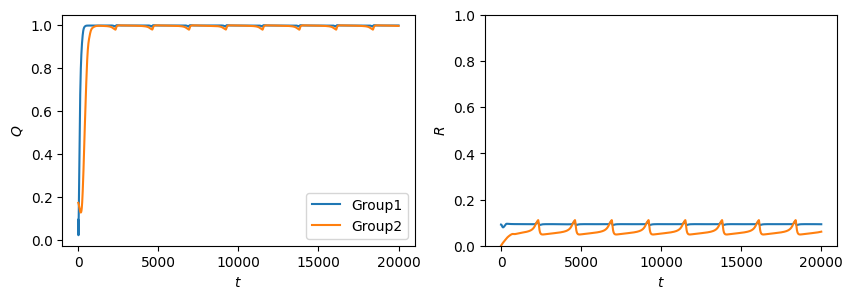

In [4]:
t = np.arange(0,20000,0.1)
# t = t*10
beta = 0.3
alpha = np.pi/2 - 0.01
K = 1
N1 = N2 = 200
Nt = N1+N2
R2,R1 = 0,0
Q2,Q1 = 0,0

while (abs(Q1-Q2)<0.1):
    np.random.seed(num)
    Theta = np.random.uniform(0,2*np.pi,Nt)
    
    # Group 2는 플랫하게 분포되어 있는 경우
    np.random.seed(num+1)
    Theta[N1:N1+N2//2] = np.random.uniform(0,np.pi,N1//2)
    np.random.seed(num+1)
    Theta[N1+N2//2:] = np.random.uniform(np.pi,2*np.pi,N1//2)
    
    # Group 1은 완전하게 동기화 된 상황
    # Theta[N1//2:N1] = 0 + np.pi
    # Theta[:N1//2] = 0
    sol,(Z1as,Z1bs,Z2as,Z2bs) = RK4_ZZ(Kuramoto_MF_CHIMERA,Theta,t,args=(N1,N2,beta,alpha,K))
    R1 = np.abs(Z1as[-1])
    R2 = np.abs(Z1bs[-1])
    Q1 = np.abs(Z2as[-1])
    Q2 = np.abs(Z2bs[-1])
    R1s.append(R1)
    R2s.append(R2)
    Q1s.append(Q1)
    Q2s.append(Q2)
    # print(R1,R2)
    print(Q1,Q2,np.abs(Q1-Q2))
    # num+=1 
    break

plt.figure(figsize=(10,3))
plt.subplot(121)
plt.plot(t,abs(Z2as),label='Group1')
plt.plot(t,abs(Z2bs),label='Group2')
plt.legend()
plt.ylabel(r'$Q$')
plt.xlabel(r'$t$')
# plt.ylim(0,1)
plt.subplot(122)
plt.plot(t,abs(Z1as))
plt.plot(t,abs(Z1bs))
plt.ylabel(r'$R$')
plt.xlabel(r'$t$')
plt.ylim(0,1)


plt.show()

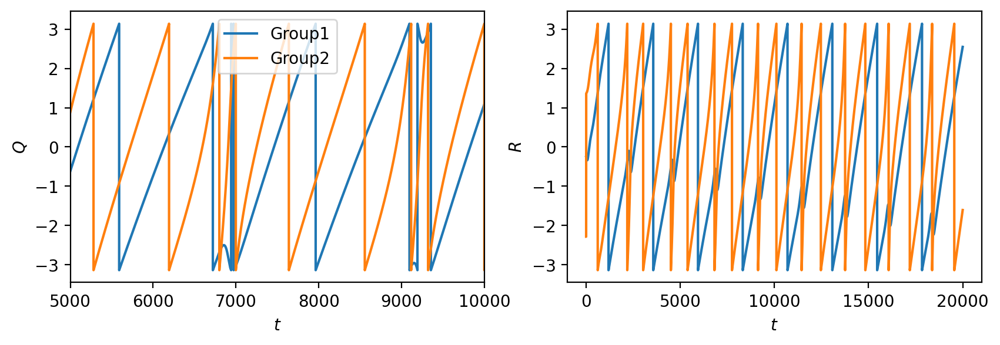

In [16]:

plt.figure(figsize=(10,3))
plt.subplot(121)
plt.plot(t,np.angle(Z2as),label='Group1')
plt.plot(t,np.angle(Z2bs),label='Group2')
plt.legend()
plt.ylabel(r'$Q$')
plt.xlabel(r'$t$')
plt.xlim(5000,10000)
plt.subplot(122)
plt.plot(t,np.angle(Z1as))
plt.plot(t,np.angle(Z1bs))
plt.ylabel(r'$R$')
plt.xlabel(r'$t$')


plt.show()

In [ ]:
Theta = sol[-1]
# t = np.arange(0,2000,0.1)


(array([29.,  0.,  0.,  0., 92.,  0.,  0.,  0.,  0., 79.]),
 array([52.32690035, 52.95521888, 53.58353741, 54.21185594, 54.84017447,
        55.468493  , 56.09681153, 56.72513006, 57.3534486 , 57.98176713,
        58.61008566]),
 <BarContainer object of 10 artists>)

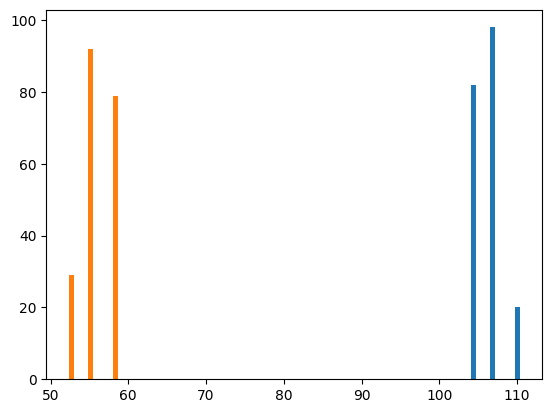

In [ ]:
plt.hist(Theta[N1:])
plt.hist(Theta[:N1])

In [ ]:
t = np.arange(0,150000,0.1)
Theta = sol[-1]

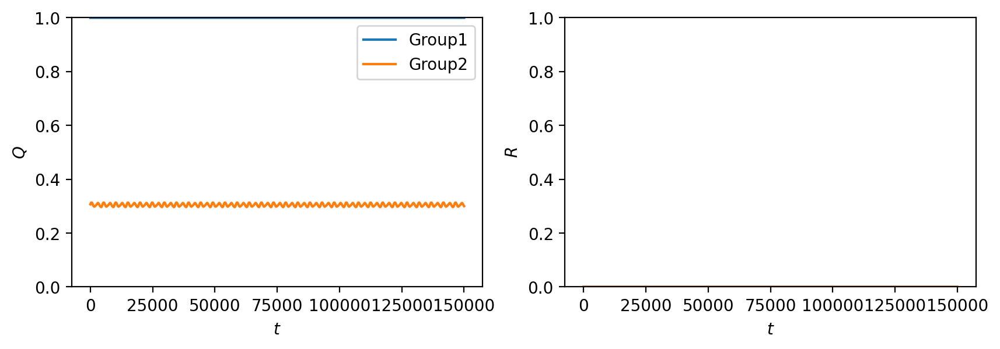

In [ ]:
sol,(Z1as,Z1bs,Z2as,Z2bs) = RK4_ZZ(Kuramoto_MF_CHIMERA,Theta,t,args=(N1,N2,beta,alpha,K))
plt.figure(figsize=(10,3))
plt.subplot(121)
plt.plot(t,abs(Z2as),label='Group1')
plt.plot(t,abs(Z2bs),label='Group2')
plt.legend()
plt.ylabel(r'$Q$')
plt.xlabel(r'$t$')
plt.ylim(0,1)
plt.subplot(122)
plt.plot(t,abs(Z1as))
plt.plot(t,abs(Z1bs))
plt.ylabel(r'$R$')
plt.xlabel(r'$t$')
plt.ylim(0,1)
plt.show()

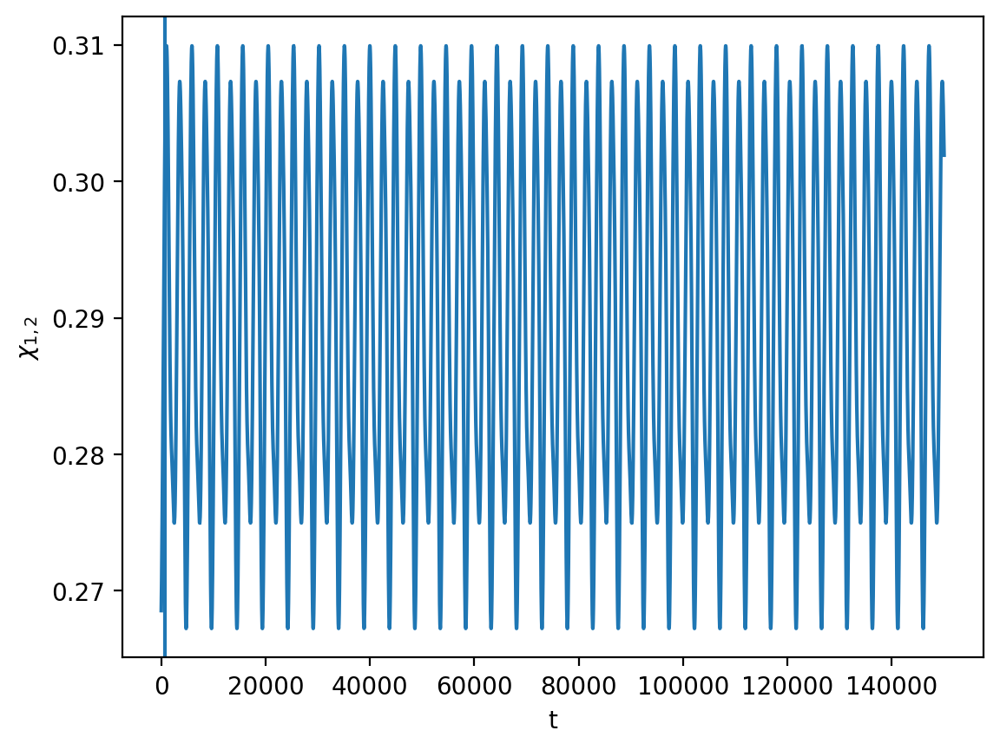

In [ ]:
plt.plot(t,(np.angle(Z2as)-np.angle(Z2bs))%(np.pi))
# plt.plot(t,)
plt.xlabel('t')
plt.ylabel(r'$\chi_{1,2}$')
plt.axvline(t[7000])

([<matplotlib.axis.XTick at 0x143c878d0>,
 [Text(0, 0, '0'),
  Text(100, 0, 'Group1'),
  Text(200, 0, '200'),
  Text(300, 0, 'Group2'),
  Text(400, 0, '400')])

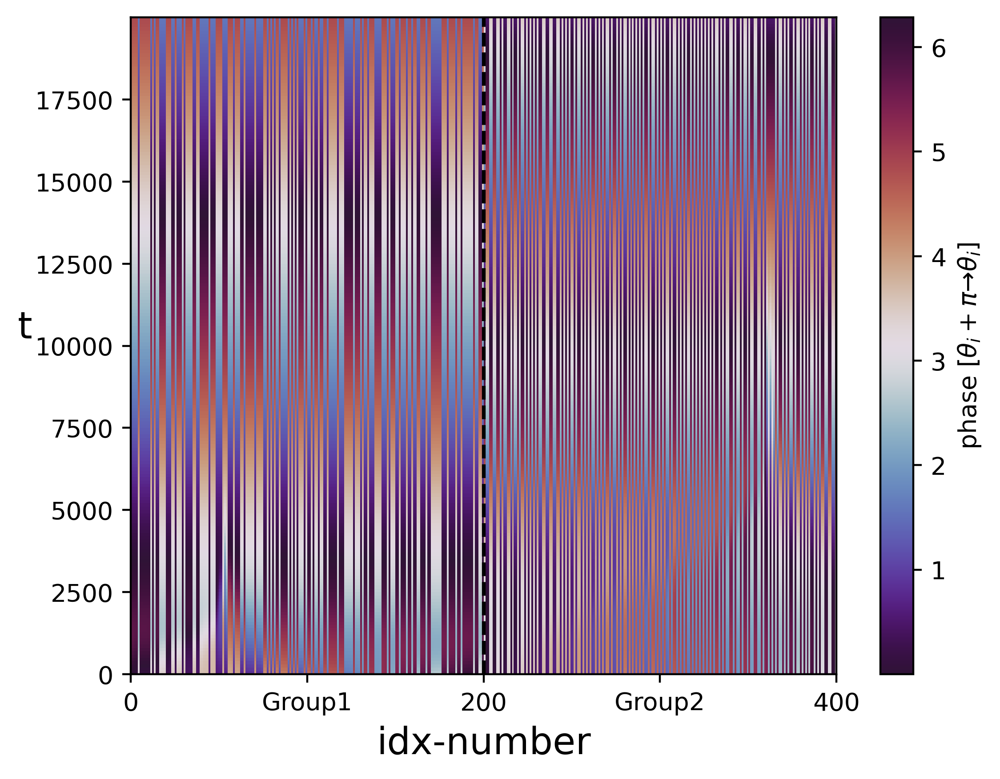

In [6]:
G1 =  np.argsort(sol[0][:N1]%(np.pi))
G2 =  np.argsort(sol[0][N1:]%(np.pi))
SG12 = np.array([*G1,*(N1+G2)])
# plt.imshow((sol[-300:,:])%np.pi,origin='lower',cmap='twilight_shifted',aspect='auto')
plt.figure(dpi=400)
# plt.imshow(sol[-300:,SG12]%np.pi,origin='lower',cmap='twilight_shifted',aspect='auto',extent=[0,2*N,t[-300],t[-1]])
plt.imshow(sol[0:20000:100,SG12]%(2*np.pi),origin='lower',cmap='twilight_shifted',aspect='auto',extent=[0,2*N1,t[0],t[-1]])
cbar = plt.colorbar()
cbar.set_label(r'phase [$\theta_i+\pi\to\theta_i$]')

plt.axvline(N1,color='black',ls='--')
plt.ylabel('t',rotation=0,fontsize=15)
plt.xlabel('idx-number',fontsize=15)
plt.xticks([0,N1//2,N1,N1+(N1//2),2*N1],[0,'Group1',N1,'Group2',2*N1])


# plt.imshow(sol[:]%np.pi,origin='lower',cmap ='hsv')


In [7]:
index = 0#100
num_bin = 0
bins = np.linspace(0,2*np.pi,num_bin+1)
bin_ = np.linspace(0,2*np.pi,num_bin)
cs1,_ = np.histogram((sol[-index,N1:])%(2*np.pi),bins=bins,density=True)
cs2,_ = np.histogram(sol[-index,:N1]%(np.pi*2),bins=bins,density=True)
cs1 = cs1 / np.max(cs1)
cs2 = cs2 / np.max(cs2)


bottom = 1
max_height = 1
radii1 = max_height*cs1
radii2 = max_height*cs2
width = (2*np.pi) / num_bin

ax = plt.subplot(111, polar=True)
bars1 = ax.bar(bin_, radii1, width=width, bottom=bottom)
bars2 = ax.bar(bin_, radii2, width=width, bottom=bottom)

# Use custom colors and opacity
for r, bar in zip(radii1, bars1):
    # bar.set_facecolor(plt.cm.autumn(r/5))
    bar.set_facecolor(plt.cm.jet(r/5))
    bar.set_alpha(0.8)
    
    
for r, bar in zip(radii1, bars2):
    bar.set_facecolor(plt.cm.autumn(r/5))
    # bar.set_facecolor(plt.cm.jet(r/5))
    bar.set_alpha(0.8)
    
plt.plot([0,np.angle(Z1as[-1])],[0,abs(Z1as[-1])],color='black',lw=3,marker='o')
plt.plot([0,np.angle(Z2as[-1])],[0,abs(Z2as[-1])],color='orange',lw=3,marker='o')
plt.text(np.angle(Z2as[-1])-0.6,abs(Z2as[-1]),r'$r_2$',color='red',fontsize=14)
plt.text(np.angle(Z1as[-1]),abs(Z1as[-1])+0.2,r'$r_1$',color='black',fontsize=14)

plt.plot([0,np.angle(Z1bs[-1])],[0,abs(Z1bs[-1])],color='black',lw=3,marker='o')
plt.plot([0,np.angle(Z2bs[-1])],[0,abs(Z2bs[-1])],color='orange',lw=3,marker='o')
plt.text(np.angle(Z2bs[-1])-0.6,abs(Z2bs[-1]),r'$r_2$',color='red',fontsize=14)
plt.text(np.angle(Z1bs[-1]),abs(Z1bs[-1])+0.2,r'$r_1$',color='black',fontsize=14)
# for r, bar in zip(radii2, bars2):
#     bar.set_facecolor(plt.cm.jet_r(r/5))
#     bar.set_alpha(0.8)
plt.ylim(0,2)
plt.yticks([0,1,2])
plt.show()

ValueError: zero-size array to reduction operation maximum which has no identity

(-1.0999999996205132, 1.0999999996205132, -1.09999998708898, 1.09999972886858)

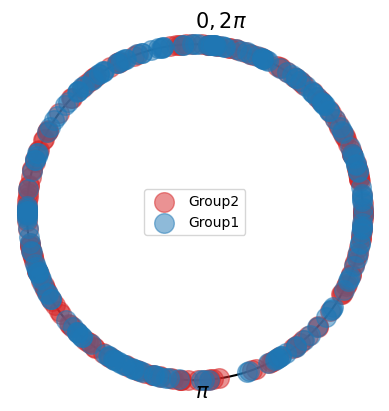

In [8]:
x = np.linspace(-np.pi,np.pi,1000)
fig = plt.figure()
ax =plt.gca()
ax.set_aspect(1)
ax.plot(np.sin(x),np.cos(x),color='k',zorder=-10)
idx= 0;
sca1 = ax.scatter(np.sin(sol[idx][N1:]),np.cos(sol[idx][N1:]),color='tab:red',label='Group2',s=200,alpha=0.5)
sca2 = ax.scatter(np.sin(sol[idx][:N1]),np.cos(sol[idx][:N1]),color='tab:blue',label='Group1',s=200,alpha=0.5,zorder=2)
ax.legend()
# idx= -1;plt.scatter(np.sin(sol[idx]),np.cos(sol[idx]))
# idx= 110;plt.scatter(np.sin(sol[-idx]),np.cos(sol[-idx]))
plt.text(0,1.1,r'$0,2\pi$',fontsize=15)
plt.text(0,-1.1,r'$\pi$',fontsize=15)
plt.axis('off')

In [11]:
def FOR_DATA(sol):
    DATA1 = list(zip(np.cos(sol[:,N1:]),np.sin(sol[:,N1:])))
    DATA2 = list(zip(np.cos(sol[:,:N1]),np.sin(sol[:,:N1])))
    DATA1 = [list(zip(*data)) for data in DATA1] 
    DATA2 = [list(zip(*data)) for data in DATA2]
    return DATA1,DATA2 

DATA1,DATA2 = FOR_DATA(sol)

def get_ani(idx):
    sca2.set_offsets(DATA2[idx])
    sca1.set_offsets(DATA1[idx])

len(t)
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import matplotlib
matplotlib.rcParams['animation.embed_limit'] = 2**128
%config InlineBackend.figure_format = 'retina'
idxs=  np.arange(000,40_000,1000)
ani = FuncAnimation(fig,get_ani,frames=idxs,interval=50)
len(t)
HTML(ani.to_jshtml())
# ani.save(rf'HIGH ORDER CHIMERA/SB_B 2pi N={N1},alpha={alpha:.01f},beta={beta:.01f}.mp4',dpi=300)

In [ ]:
100000

100000

(-1.0999986402114572,
 1.0999986402114572,
 -1.0999997527658723,
 1.0999948080833182)

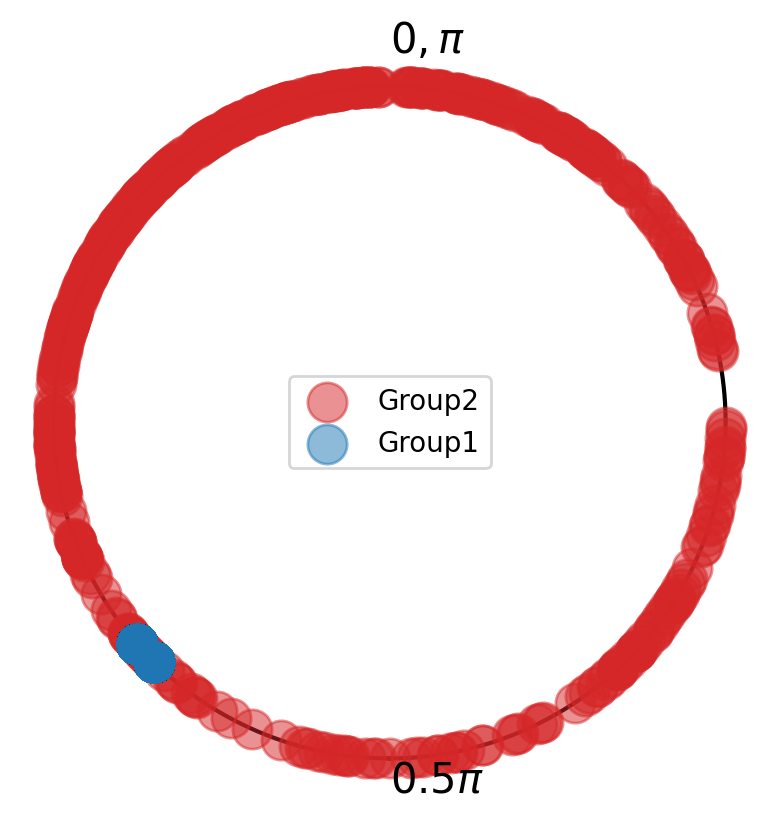

In [ ]:
x = np.linspace(-np.pi,np.pi,1000)
fig = plt.figure()
plt.axes().set_aspect(1)
plt.plot(np.sin(x),np.cos(x),color='k',zorder=-10)
ax = plt.gca()
idx= 0;
sca1 = ax.scatter(np.sin(2*sol[idx][N1:]),np.cos(2*sol[idx][N1:]),color='tab:red',label='Group2',s=200,alpha=0.5)
sca2 = ax.scatter(np.sin(2*sol[idx][:N1]),np.cos(2*sol[idx][:N1]),color='tab:blue',label='Group1',s=200,alpha=0.5,zorder=2)
plt.legend()
# idx= -1;plt.scatter(np.sin(sol[idx]),np.cos(sol[idx]))
# idx= 110;plt.scatter(np.sin(sol[-idx]),np.cos(sol[-idx]))

plt.text(0,1.1,r'$0,\pi$',fontsize=15)
plt.text(0,-1.1,r'$0.5\pi$',fontsize=15)
plt.axis('off')

In [ ]:
def FOR_DATA(sol):
    DATA1 = list(zip(np.cos(2*sol[:,N1:]),np.sin(2*sol[:,N1:])))
    DATA2 = list(zip(np.cos(2*sol[:,:N1]),np.sin(2*sol[:,:N1])))
    DATA1 = [list(zip(*data)) for data in DATA1] 
    DATA2 = [list(zip(*data)) for data in DATA2]
    return DATA1,DATA2 

DATA1,DATA2 = FOR_DATA(sol)

def get_ani(idx):
    sca2.set_offsets(DATA2[idx])
    sca1.set_offsets(DATA1[idx])

len(t)
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import matplotlib
matplotlib.rcParams['animation.embed_limit'] = 2**128
%config InlineBackend.figure_format = 'retina'
idxs=  np.arange(7_000,8_000,5)
ani = FuncAnimation(fig,get_ani,frames=idxs,interval=50)
len(t)
HTML(ani.to_jshtml())
# ani.save(rf'HIGH ORDER CHIMERA/SB_B pi N={N1},alpha={alpha:.01f},beta={beta:.01f}.mp4',dpi=300)